# **Exploring the data**

In [1]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import random_split, DataLoader # for dataloaders 
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchvision import datasets
from torchvision import models


%matplotlib inline

In [2]:
data_dir = "../input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)

In [3]:
# printing the disease names
print(diseases)

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

In [4]:
diseases_train = os.listdir(train_dir)
diseases_valid = os.listdir(valid_dir)

print("Total disease classes in train are: {}".format(len(diseases_train)))
print("Total disease classes in valid are: {}".format(len(diseases_valid)))


Total disease classes in train are: 38
Total disease classes in valid are: 38


# Train subset

* extract the number of unique plants and number of unique diseases

In [5]:
# train
plants = []
NumberOfDiseases = 0
for plant in diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1

In [6]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Tomato', 'Grape', 'Orange', 'Soybean', 'Squash', 'Potato', 'Corn_(maize)', 'Strawberry', 'Peach', 'Apple', 'Blueberry', 'Cherry_(including_sour)', 'Pepper,_bell', 'Raspberry']


In [7]:
# number of unique plants
print("Number of plants: {}".format(len(plants)))

Number of plants: 14


In [8]:
# number of unique diseases
print("Number of diseases: {}".format(NumberOfDiseases))

Number of diseases: 26


In the dataset, we have images of leaves from 14 distinct plant species. Excluding the images of healthy leaves, the dataset comprises 26 unique classes, each representing a specific plant disease associated with a particular plant species.

In [9]:
# Number of images for each disease 
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Late_blight,1851
Tomato___healthy,1926
Grape___healthy,1692
Orange___Haunglongbing_(Citrus_greening),2010
Soybean___healthy,2022
Squash___Powdery_mildew,1736
Potato___healthy,1824
Corn_(maize)___Northern_Leaf_Blight,1908
Tomato___Early_blight,1920
Tomato___Septoria_leaf_spot,1745


Visualizing the above information on a graph

In [10]:
plt.figure(figsize=(60, 60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

# Iterating over the classes in the training directory
for i in diseases:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7, 7, cnt)
    
    image_path = os.listdir(train_dir + "/" + i)
    tot_images += len(image_path)
    
    # Display the first image in the class directory
    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    
    plt.imshow(img_show)
    plt.xlabel(i, fontsize=20)
    plt.xticks([])
    plt.yticks([])

print("\nTotal Number of Images in Directory:", tot_images)


Total Number of Images in Directory: 70295


Text(0.5, 1.0, 'Images per each class of plant disease')

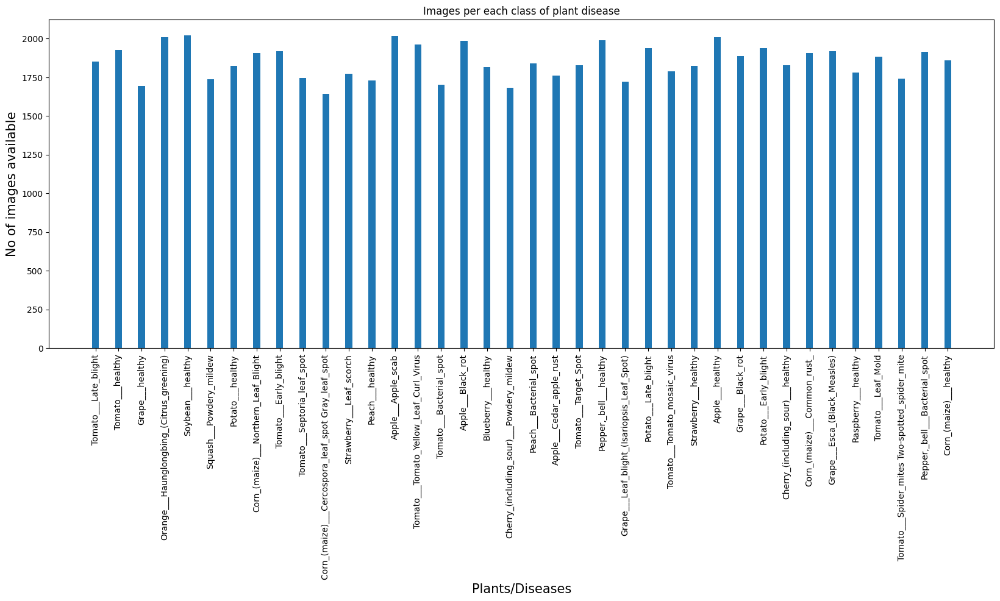

In [11]:
# plotting number of images available for each disease
index = [n for n in range(38)]
plt.figure(figsize=(20, 7))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=15)
plt.ylabel('No of images available', fontsize=15)
plt.xticks(index, diseases, fontsize=10, rotation=90)
plt.title('Images per each class of plant disease')

In [12]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 70295 images for training


# Validation subset

In [13]:
# Number of images for each disease - validation
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(valid_dir + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Late_blight,463
Tomato___healthy,481
Grape___healthy,423
Orange___Haunglongbing_(Citrus_greening),503
Soybean___healthy,505
Squash___Powdery_mildew,434
Potato___healthy,456
Corn_(maize)___Northern_Leaf_Blight,477
Tomato___Early_blight,480
Tomato___Septoria_leaf_spot,436


Text(0.5, 1.0, 'Images per each class of plant disease')

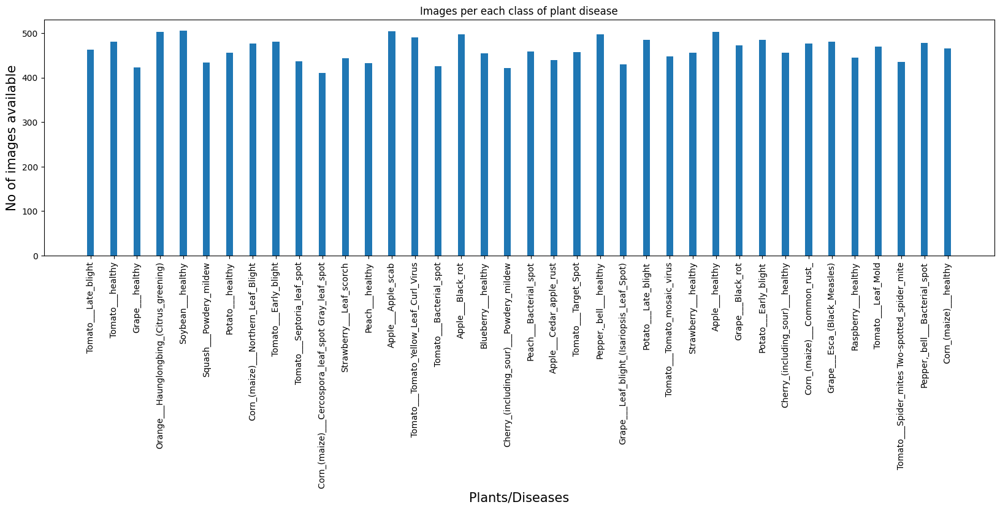

In [14]:
# plotting number of images available for each disease
index = [n for n in range(38)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=15)
plt.ylabel('No of images available', fontsize=15)
plt.xticks(index, diseases, fontsize=10, rotation=90)
plt.title('Images per each class of plant disease')

We observed that the dataset is nearly balanced across all classes

In [15]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for validation")

There are 17572 images for validation


# Data Sample Visualization

In [16]:
# datasets for validation and training
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

# for checking some images from training dataset
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))

**Some Images from training dataset**

Label :Apple___Apple_scab(0)


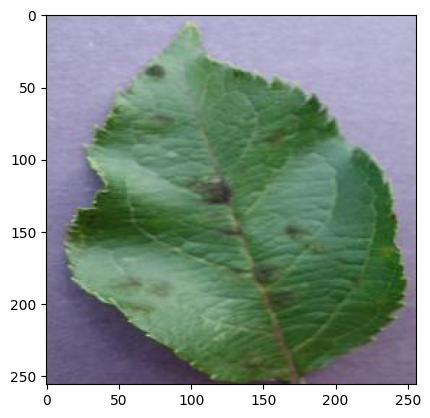

In [17]:
show_image(*train[0])

Label :Apple___Apple_scab(0)


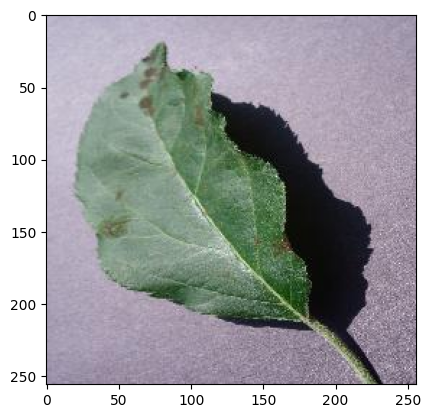

In [18]:
show_image(*train[600])

Label :Tomato___healthy(37)


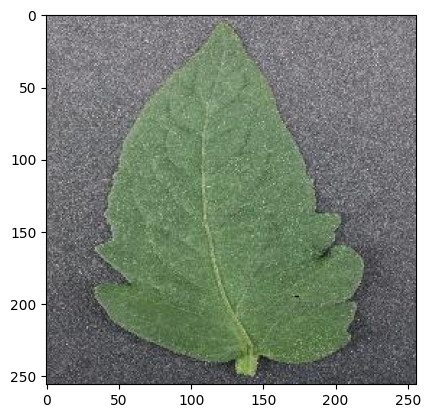

In [19]:
show_image(*train[70060])

Label :Peach___Bacterial_spot(16)


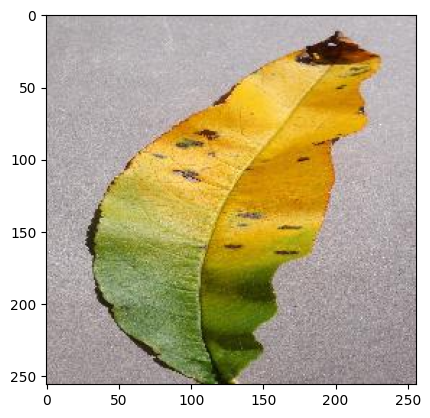

In [20]:
show_image(*train[30060])